# Importing necessary  libraries:

In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import csv
import re
import string
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from bidi.algorithm import get_display  # For Hebrew text handling
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
from PIL import Image
import seaborn as sns

# Data Acquisition

Create a generator with user agents. Generators are iterators, a kind of iterable you can only iterate over once. Generators do not store all the values in memory, they generate the values on the fly.

In [ ]:
def userAgents():
    while True:
        with open('Files/user-agents.txt', 'r') as f:
            for row in f:
                yield row.strip()
            f.seek(0)

userAgent = userAgents()

Acquisition of the main page of the website:

In [ ]:
url="https://shop.super-pharm.co.il/"
user_agent = {'User-agent': 'Mozilla/5.0'}
response = requests.get(url,headers=user_agent)
soup = BeautifulSoup(response.content, "html.parser")

Create a data frame:

In [ ]:
df = pd.DataFrame(columns=['Product Name', 'Product Brand', 'Price', 'Description', 'Category', 'Subcategory'])

Collecting the categories: 

In [ ]:
ca= soup.find("div", attrs={"class":"row phcBlockCategorySpHomeWrap"})
items= ca.find_all("a")
Items= [items[i] for i in [0,1,4,6,8,12]]

Let's start aquiring our data:  

In [ ]:
num=0
num2=0
stop=0

In [ ]:
for item in Items:
    #categories
    mainCategory= item['title']
    link= 'https://shop.super-pharm.co.il' + item['href']
    new_response = requests.get(link,headers={'User-Agent': next(userAgent)})
    new_soup = BeautifulSoup(new_response.content, "html.parser")

    #subcategories
    if(new_soup.find_all("div", attrs={"class":"col-lg-2 col-md-2 col-sm-2 col-xs-6 phcCategoryWrap"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-2 col-md-2 col-sm-2 col-xs-6 phcCategoryWrap"})
                                                   
    elif (new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcCategoryWrap"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcCategoryWrap"})
                                                   
    elif(new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-12 phcProductWrap"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-12 phcProductWrap"})
                                                   
    elif(new_soup.find_all("div", attrs={"class":"col-lg-2 col-md-2 col-sm-2 col-xs-6 phcCategoriesBlock"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-2 col-md-2 col-sm-2 col-xs-6 phcCategoriesBlock"})
                                                   
    elif(new_soup.find_all("div", attrs={"class":"col-lg-4 col-md-4 col-sm-4 col-xs-6 phcCategoryWrap"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-4 col-md-4 col-sm-4 col-xs-6 phcCategoryWrap"})
    
    elif(new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcCategoriesWrap"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcCategoriesWrap"})
                                                   
    elif(new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcBlockCat"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcBlockCat"})
                    
    elif(new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcBlockCategoryWrap"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcBlockCategoryWrap"})
                                                   
    elif(new_soup.find_all("div", attrs={"class":"col phcCategoriesHobbies"})):
        categories=new_soup.find_all("div", attrs={"class":"col phcCategoriesHobbies"})
                                                   
    elif(new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcCategoriesWrap"})):
        categories=new_soup.find_all("div", attrs={"class":"col-lg-3 col-md-3 col-sm-3 col-xs-6 phcCategoriesWrap"})
                                                   
                                                   
    else:
        continue
    
    num=0
    num2=0
    for c in categories:
                                                   
        if (c.find("a")):
            subcategory=c.find("a")['title']
        else:
            continue
                
        link= 'https://shop.super-pharm.co.il' + c.find("a")['href']
        new_response = requests.get(link,headers={'User-Agent': next(userAgent)})
        new_soup = BeautifulSoup(new_response.content, "html.parser")
        more=new_soup.find("a", attrs={"id":"nextHiddenLink"})
        while more:
            products= new_soup.find_all("a", attrs={"class":"item-box-link"})
            for product in products:
                name= brand= price= description=''
                product_link= 'https://shop.super-pharm.co.il' + product['href']
                product_response = requests.get(product_link,headers={'User-Agent': next(userAgent)})
                product_soup = BeautifulSoup(product_response.content, "html.parser")
                des= product_soup.find("div", attrs={"class":"content-side"})
                if des:
                    description=des.find("p").get_text()
                if (product_soup.find("span", attrs={"class":"product-title"})):
                    brand=product_soup.find("span", attrs={"class":"product-title"}).text
                if (product_soup.find("span", attrs={"class":"product-name"})):
                    name=product_soup.find("span", attrs={"class":"product-name"}).text
                if (product_soup.find("div", attrs={"class":"shekels money-sign"})):
                    price=product_soup.find("div", attrs={"class":"shekels money-sign"}).text
                
                num+=1
                num2+=1
                new_row = pd.DataFrame({'Product Name': [name],
                    'Product Brand': [brand],
                    'Price': [price],
                    'Description': [description],
                    'Category': [mainCategory], 'Subcategory' : [subcategory]})

                df = pd.concat([df, new_row], ignore_index=True)
                df.to_csv(r'C:\Users\shani\projectCategories.csv', index=False, encoding='utf-8-sig')
                if(len(categories)>10):
                    if(num>300):
                        num=0
                        stop=1
                        break 
                elif(num>800):
                    num=0
                    stop=1
                    break
            if (stop==1):
                stop=0
                break
            load= more['href']
            res=requests.get(load,headers={'User-Agent': next(userAgent)})
            new_soup=BeautifulSoup(res.content, "html.parser")
            more=new_soup.find("a", attrs={"id":"nextHiddenLink"})
        
        if(num2>5000):
            num=0
            num2=0
            continue
        num2=0
        num=0
        

Load our csv file:

In [2]:
df=pd.read_csv("Files/projectCategories.csv", encoding='utf-8-sig')
df

,Product Name,Product Brand,Price,Description,Category,Subcategory
0,מעבד מזון ובלנדר דגם BN800,NINJA,619,"3 מכשירים ב -1 מעבד מזון, נוטרי בלנדר ושייקר מ...",חשמל ואלקטרוניקה,מוצרי חשמל קטנים למטבח
1,מיקסר KMX750,KENWOOD,799,המיקסר החדש והמסוגנן בעיצוב עכשווי איכותי ולא...,חשמל ואלקטרוניקה,מוצרי חשמל קטנים למטבח
2,קומקום לתינוק – הקומקום הבריאותי לתינוק מזכוכי...,קנדי,495,"קומקום לתינוק, בעל פטנט בלעדי של חברת קנדי, מי...",חשמל ואלקטרוניקה,מוצרי חשמל קטנים למטבח
3,נוטרי נינג'ה בלנדר QB3001,NINJA,279,נוטרי נינג'ה AUTO IQ שייק מקצועי להכנת משקאו...,חשמל ואלקטרוניקה,מוצרי חשמל קטנים למטבח
4,‏מטחנת בשר ME106,Moulinex,207,מטחנת בשר עוצמתית: 1400Wיכולת עיבוד בשר מקסימל...,חשמל ואלקטרוניקה,מוצרי חשמל קטנים למטבח
...,...,...,...,...,...,...
19426,פולי קפה GRANAROMA לבן - 3 קילו,ESPRESSO 1882,430,"תערובת פולי קפה עם טעם עשיר ומתמשך, תערובת קלא...",מזון ומשקאות,ללא גלוטן
19427,פולי קפה ESPRESSO אדום,ESPRESSO 1882,430,"תערובת פולי הקפה המתאפיינת בגוף מלא עשיר בטעם,...",מזון ומשקאות,ללא גלוטן
19428,פולי קפה ANTICA BOTTEGA זהב,ESPRESSO 1882,430,"100% פולי קפה ערביקה. שילוב של ערביקה מברזיל, ...",מזון ומשקאות,ללא גלוטן
19429,תערובת מאפינס להכנה מהירה ללא גלוטן,Bob's Red Mill,43.90,Bob's Red Mill Grain Free Blueberry Muffin Mix...,מזון ומשקאות,ללא גלוטן


Let's start cleaning our data!

# Cleaning and exploring the data

## Remove rows with missing values:

In [3]:
df_clean=df.dropna(axis=0, how='any').copy()

## Remove duplicated rows:

Now we will look at the rows that are the same in all the columns except the "Subcategory" column, that's because there are some products that apear more then once and may apear in the same category but different subcategory. if the products are duplicated also in the subcategory we will still see that here and remove them later aswell.

In [4]:
# Sort the DataFrame 
df_sorted = df_clean.sort_values(['Category', 'Description', 'Price', 'Product Brand', 'Product Name'])

# Filter the sorted DataFrame for duplicates
duplicated_rows = df_sorted[df_sorted.duplicated(['Category', 'Description', 'Price', 'Product Brand', 'Product Name'], keep=False)]

duplicated_rows

,Product Name,Product Brand,Price,Description,Category,Subcategory
13343,חטיפי אילוף איכותיים ללא דגנים לכלבים - 200 גרם,Carnilove,29,חטיף אילוף ופינוק בעל טעימות גבוהה - עשוי מרכי...,בעלי חיים,כלבים
13344,חטיפי אילוף איכותיים ללא דגנים לכלבים - 200 גרם,Carnilove,29,חטיף אילוף ופינוק בעל טעימות גבוהה - עשוי מרכי...,בעלי חיים,כלבים
13347,חטיפי אילוף איכותיים ללא דגנים לכלבים - 200 גרם,Carnilove,29,חטיף אילוף ופינוק בעל טעימות גבוהה - עשוי מרכי...,בעלי חיים,כלבים
13348,חטיפי אילוף איכותיים ללא דגנים לכלבים - 200 גרם,Carnilove,29,חטיף אילוף ופינוק בעל טעימות גבוהה - עשוי מרכי...,בעלי חיים,כלבים
13349,חטיפי אילוף איכותיים ללא דגנים לכלבים - 200 גרם,Carnilove,29,חטיף אילוף ופינוק בעל טעימות גבוהה - עשוי מרכי...,בעלי חיים,כלבים
...,...,...,...,...,...,...
9332,משאית מפלצת תנין,דוורון,39,• משאית צעצוע אינטראקטיבית עם איור שור המסייעת...,צעצועים,1-2 שנים
12023,משאית מפלצת תנין,דוורון,39,• משאית צעצוע אינטראקטיבית עם איור שור המסייעת...,צעצועים,עד 100 ₪
6327,"מתקן שעשועים משולב 3 ב-1 נדנדה, מגלשה וכדורסל",Hilis,599,✔️ עשוי פלסטיק חזק ועמיד✔️ מתאים לשימוש עד 30 ...,צעצועים,משחקי חוץ
9379,"מתקן שעשועים משולב 3 ב-1 נדנדה, מגלשה וכדורסל",Hilis,599,✔️ עשוי פלסטיק חזק ועמיד✔️ מתאים לשימוש עד 30 ...,צעצועים,1-2 שנים


Now we will remove the duplicated rows based on specific columns:

In [5]:
df_clean = df_clean.drop_duplicates(subset=['Category', 'Description', 'Price', 'Product Brand', 'Product Name'])

Let's explore the data

In [6]:
print(df_clean['Subcategory'].unique()) 

['מוצרי חשמל קטנים למטבח' 'כביסה וניקיון' 'מסכים וסאונד'
 'טלפונים סלולרים ואביזרים' 'גיימינג' 'מיזוג וחימום הבית'
 'מכשירי טיפוח ועיצוב שיער' 'בישול ואפייה' 'טאבלטים ואביזרים' 'מצלמות'
 'שעונים חכמים וצמידי כושר' 'מחשבים' 'סוללות' 'תאורה' 'ציוד ספורט וכושר'
 'מכשירי כושר ומשקולות' 'יוגה ופילאטיס' 'מחנאות וטיולים' 'ריצה'
 'גלגליליות ורולרבליידס' 'משחקי ספורט ופנאי' 'רכיבה על אופניים'
 'נעלי ספורט' 'ביגוד ספורט לנשים' 'ביגוד תרמי' 'ספורט ימי'
 'אומנויות לחימה' 'תזונת ספורט' 'בובות ודמויות צעצוע' 'בריכות ומשחקי מים'
 'משחקי יצירה' 'משחקי חוץ' 'צעצועי רכיבה' 'משחקי קופסה' 'צעצועי ספורט'
 'כלי רכב צעצוע' 'צעצועי בנייה' 'משחקי כאילו' 'צעצועים חינוכיים'
 'צעצועים מוזיקליים' 'צעצועים על שלט' 'צעצועי פעילות'
 'צעצועי כלי נשק ורובוטים' 'משחקי וידיאו' 'בובות POP' 'בתי בובות ואביזרים'
 '0-12 חודשים' '1-2 שנים' '3-4 שנים' '5-7 שנים' '8-13 שנים' 'כל המשפחה'
 'Pokémon' 'מפרץ ההרפתקאות' 'מטוסי על' 'סמי הכבאי' 'CoCoMelon' 'LOL'
 'Play-Doh' 'Winfun' 'קיפי' 'Buki France' "Hili's" 'Spark Toys' 'עד 100 ₪'

## Distribution of categories and subcategories

Here we can see a bar plot of the distribution of categories and subcategories. the categories are in the x axis and the subcategories in the colors, the y axis is the frequency of each category:

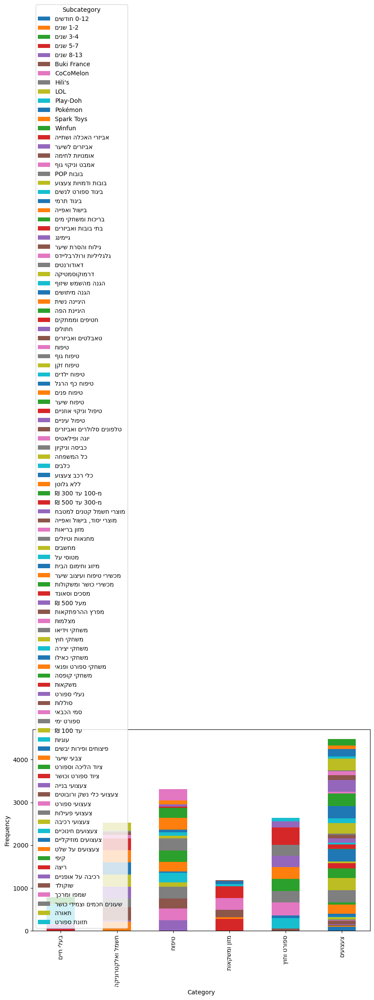

In [7]:
# Group the data by Category and Subcategory and count the occurrences
grouped_data = df_clean.groupby(['Category', 'Subcategory']).size().unstack()

fig, ax = plt.subplots(figsize=(10, 6))

grouped_data.plot(kind='bar', stacked=True, ax=ax)

ax.set_xlabel('Category')
ax.set_ylabel('Frequency')

# Get the category and subcategory labels with bidi formatting (so the text won't be written backwards)
category_labels = [get_display(category) for category in grouped_data.index]
subcategory_labels = [get_display(subcategory) for subcategory in grouped_data.columns]

ax.set_xticklabels(category_labels)

ax.legend(subcategory_labels, title='Subcategory')

plt.show()

We don't want so many subcategories, but we also don't want only a few categories...

## Clean the categories:

Here we will create a new categorization by combining a few subcategories into one:

First, we will map the categories and subcategories along with our categories using 're' library:

In [8]:
df_clean=df_clean.copy()
subcategory_mapping = {
    (re.compile(r'.*(בישול|מטבח).*', re.IGNORECASE), re.compile(r'חשמל ואלקטרוניקה', re.IGNORECASE)): 'Kitchen Electronics',
    (re.compile(r'.*(בית|מיזוג|חימום|כביסה|ניקיון).*', re.IGNORECASE), re.compile(r'חשמל ואלקטרוניקה', re.IGNORECASE)): 'Household',
    (re.compile(r'.*(שעונים|מחשב|סוללות|תאורה|סלולר|מסך|סאונד|גיימינג|טאבלט|מצלמות).*', re.IGNORECASE), re.compile(r'חשמל ואלקטרוניקה', re.IGNORECASE)): 'Electronics',
    (re.compile(r'.*(טיפוח|עיצוב שיער).*', re.IGNORECASE), re.compile(r'חשמל ואלקטרוניקה', re.IGNORECASE)): 'Beauty Electronics',
    (re.compile(r'.*(משקולות|כושר).*', re.IGNORECASE), re.compile(r'ספורט וחוץ', re.IGNORECASE)): 'Gym',
    (re.compile(r'.*(לחימה|ספורט ימי|יוגה|מחנאות|ריצה|גלגליליות|אופניים|משחק).*', re.IGNORECASE), re.compile(r'ספורט וחוץ', re.IGNORECASE)): 'Sports',
    (re.compile(r'.*(ביגוד|נעל).*', re.IGNORECASE), re.compile(r'ספורט וחוץ', re.IGNORECASE)): 'Sport Clothing',
    (re.compile(r'.*(תזונת ספורט).*', re.IGNORECASE), re.compile(r'ספורט וחוץ', re.IGNORECASE)): 'Sport Food',
    (re.compile(r'.*(שמפו|אמבט|צבע|דאודורנט|שיער).*', re.IGNORECASE), re.compile(r'טיפוח', re.IGNORECASE)): 'Bath',
    (re.compile(r'.*(טיפוח|היגיינה|היגיינת|דרמוקוסמטיקה|טיפול|הגנה).*', re.IGNORECASE), re.compile(r'טיפוח', re.IGNORECASE)): 'Care'
}

Now let's assign the new categories

In [9]:
def assign_new_category(row):
    subcategory = str(row['Subcategory'])
    category = str(row['Category'])
    
    for pattern, new_category in subcategory_mapping.items():
        subcategory_pattern, category_pattern = pattern
        if subcategory_pattern.match(subcategory) and category_pattern.match(category):
            return new_category
    if(category == 'צעצועים'): 
        category='Toys'
    elif (category=='בעלי חיים'):
        category='Pets'
    elif (category=='מזון ומשקאות'):
        category='Food and Drinks'
    return category

df_clean['category'] = df_clean.apply(assign_new_category, axis=1)

Drop the previous 'Subcategory' and 'Category' columns since we no longer need them:

In [10]:
df_clean.drop(['Subcategory', 'Category'], axis='columns', inplace=True)

In [11]:
print(df_clean['category'].unique())

['Kitchen Electronics' 'Household' 'Electronics' 'Beauty Electronics'
 'Gym' 'Sports' 'Sport Clothing' 'Sport Food' 'Toys' 'Pets' 'Bath' 'Care'
 'Food and Drinks']


In [12]:
df_clean

,Product Name,Product Brand,Price,Description,category
0,מעבד מזון ובלנדר דגם BN800,NINJA,619,"3 מכשירים ב -1 מעבד מזון, נוטרי בלנדר ושייקר מ...",Kitchen Electronics
1,מיקסר KMX750,KENWOOD,799,המיקסר החדש והמסוגנן בעיצוב עכשווי איכותי ולא...,Kitchen Electronics
2,קומקום לתינוק – הקומקום הבריאותי לתינוק מזכוכי...,קנדי,495,"קומקום לתינוק, בעל פטנט בלעדי של חברת קנדי, מי...",Kitchen Electronics
3,נוטרי נינג'ה בלנדר QB3001,NINJA,279,נוטרי נינג'ה AUTO IQ שייק מקצועי להכנת משקאו...,Kitchen Electronics
4,‏מטחנת בשר ME106,Moulinex,207,מטחנת בשר עוצמתית: 1400Wיכולת עיבוד בשר מקסימל...,Kitchen Electronics
...,...,...,...,...,...
19411,מארז שוקולדים שחור ענק ומפנק עם פרחי סבון בעיצ...,קיפי,309,מארז שוקולדים שחור ענק והכי מפנק בשוקולדים שתמ...,Food and Drinks
19412,סוכריות קוונדיש דובדבן,קוונדיש,10,"סוכריות קשות בטעם דובדבןרכיבים: סירופ גלוקוז, ...",Food and Drinks
19418,Sun J רוטב סויה תמרי אורגני ללא גלוטן,תמרינדי,33.90,"רוטב סויה תמרי אורגני סאן ג'יי 296 מ""ל Organic...",Food and Drinks
19424,תערובת בריאות,גרעיני עפולה,8.80,תערובת בריאות מצויינת כתוספת לסלטים או כנישנוש...,Food and Drinks


Here we can see how many products there are in each of our new categories:

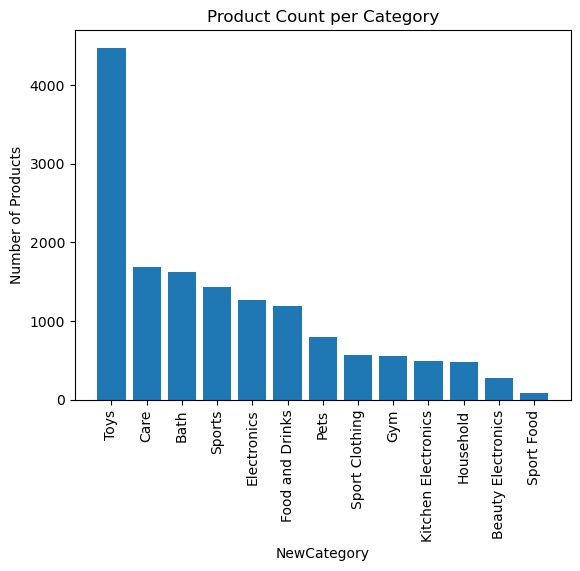

In [13]:
category_counts = df_clean['category'].value_counts()

plt.bar(category_counts.index, category_counts.values)
plt.xlabel('NewCategory')
plt.ylabel('Number of Products')
plt.title('Product Count per Category')
plt.xticks(rotation=90)
plt.show()

Now we have a better categorization, let's keep cleaning and exploring our data

In [14]:
print(df_clean['Price'].info()) 

<class 'pandas.core.series.Series'>
Int64Index: 14923 entries, 0 to 19425
Series name: Price
Non-Null Count  Dtype 
--------------  ----- 
14923 non-null  object
dtypes: object(1)
memory usage: 233.2+ KB
None


We need to change the type of the 'Price' column...

## Clean the price column and convert the prices to float:

In [15]:
df_clean=df_clean.copy()

# Remove commas from the 'Price' column
df_clean['Price'] = df_clean['Price'].str.replace(',', '').copy()

df_clean['Price'] = df_clean['Price'].astype(float)

In [16]:
print(df_clean['Price'].info()) 

<class 'pandas.core.series.Series'>
Int64Index: 14923 entries, 0 to 19425
Series name: Price
Non-Null Count  Dtype  
--------------  -----  
14923 non-null  float64
dtypes: float64(1)
memory usage: 233.2 KB
None


In [17]:
df_clean.describe()

,Price
count,14923.00000
mean,298.19294
std,717.42636
min,2.60000
25%,35.80000
50%,89.90000
75%,240.00000
max,16990.00000


## Exploring connections between columns

In this bar plot we can see the price distribution by category:

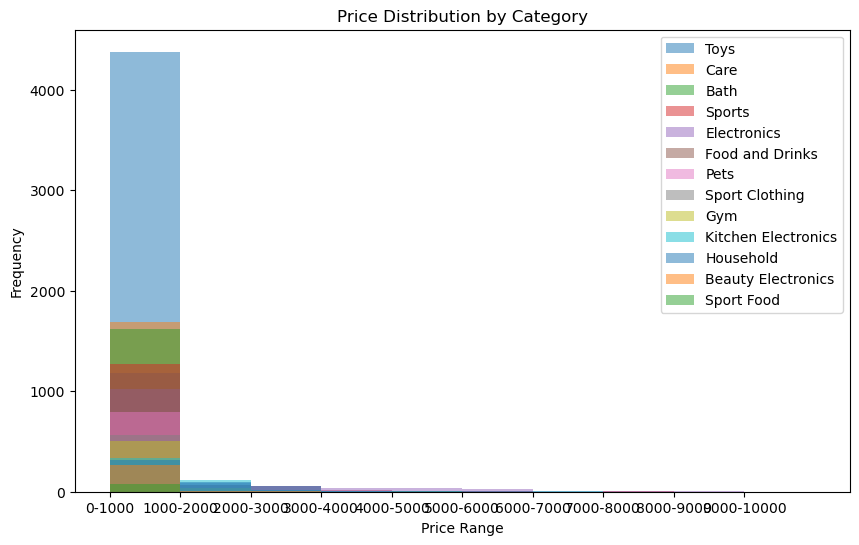

In [18]:
bins = [0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]  # Define the bin edges
labels = ['0-1000', '1000-2000', '2000-3000', '3000-4000', '4000-5000', '5000-6000', '6000-7000', '7000-8000', '8000-9000', '9000-10000']  # Define the labels for each bin

# Get the count of items in each category and sort the categories
category_counts = df_clean['category'].value_counts()
categories = category_counts.index

plt.figure(figsize=(10, 6))
# Plot the histogram for each category
for category in categories:
    data = df_clean[df_clean['category'] == category]['Price']
    plt.hist(data, bins=bins, alpha=0.5, label=category)

plt.xlabel('Price Range')
plt.ylabel('Frequency')
plt.title('Price Distribution by Category')
plt.xticks(bins[:-1], labels)  # Set custom ticks and labels on the x-axis
plt.legend()
plt.show()

As we can see, most prices are between 0 to 1000. let's take a deeper look in the distribution of prices and categories:

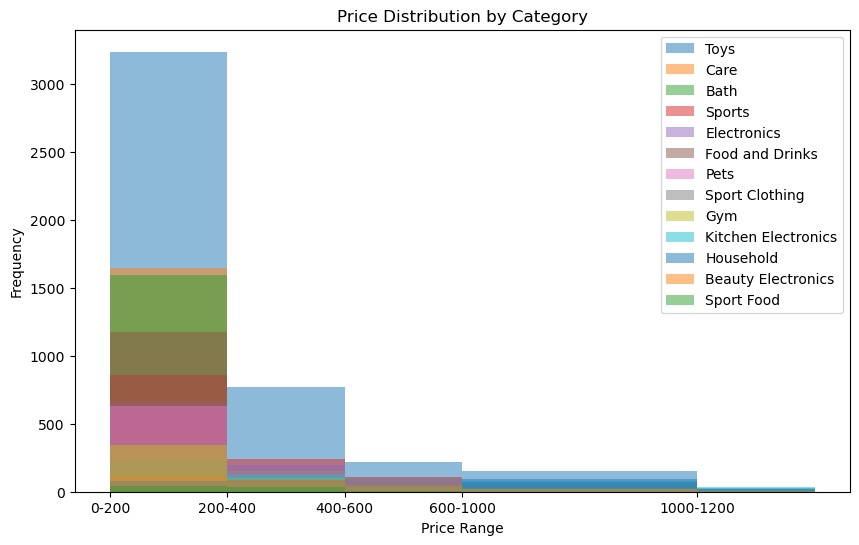

In [19]:
bins = [0, 200, 400, 600, 1000, 1200] 
labels = ['0-200', '200-400', '400-600', '600-1000', '1000-1200'] 

# Get the count of items in each category and sort the categories
category_counts = df_clean['category'].value_counts()
categories = category_counts.index

plt.figure(figsize=(10, 6))
# Plot the histogram for each category
for category in categories:
    data = df_clean[df_clean['category'] == category]['Price']
    plt.hist(data, bins=bins, alpha=0.5, label=category)

plt.xlabel('Price Range')
plt.ylabel('Frequency')
plt.title('Price Distribution by Category')
plt.xticks(bins[:-1], labels)  # Set custom ticks and labels on the x-axis
plt.legend()
plt.show()

Here we can see boxplots of price by category:

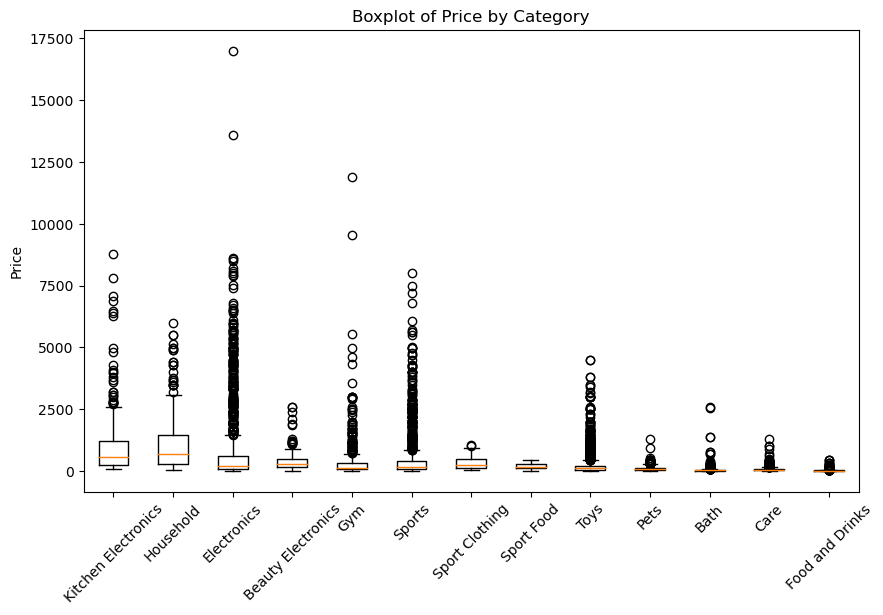

In [20]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create a list to store the data for each category
data = []

for category in df_clean['category'].unique():
    # Filter the data for the current category
    category_data = df_clean[df_clean['category'] == category]['Price']
    
    data.append(category_data)
    
ax.boxplot(data, labels=df_clean['category'].unique())

ax.set_ylabel('Price')

ax.set_title('Boxplot of Price by Category')

plt.xticks(rotation=45)

plt.show()

We can also see the distribution of price by category in a scatter plot:

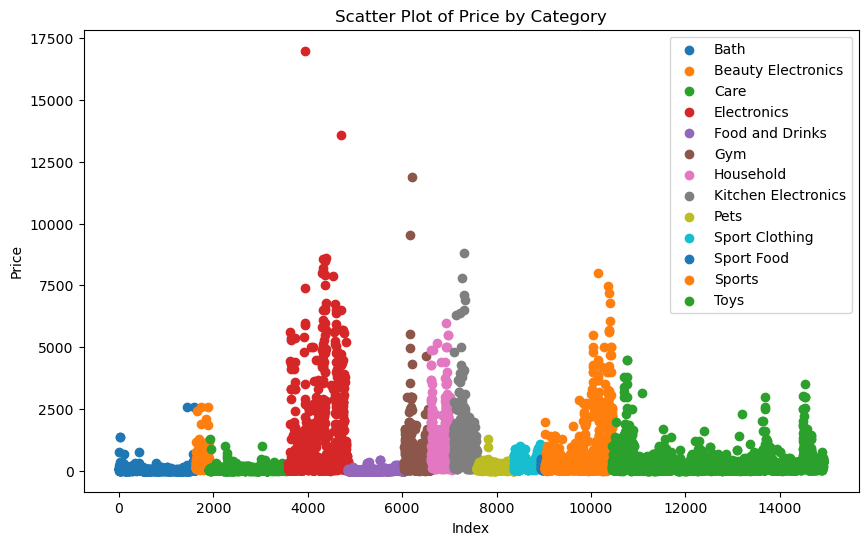

In [21]:
fig, ax = plt.subplots(figsize=(10, 6))

# Sort the DataFrame by the 'category' column
df_sorted = df_clean.sort_values('category')

# Reset the index to create a continuous numerical index
df_sorted = df_sorted.reset_index(drop=True)

for category in df_sorted['category'].unique():
    # Filter the data for the current category
    category_data = df_sorted[df_sorted['category'] == category]
    
    ax.scatter(category_data.index, category_data['Price'], label=category)

ax.set_xlabel('Index')
ax.set_ylabel('Price')
ax.set_title('Scatter Plot of Price by Category')
ax.legend()

plt.show()

Another type of scatter plot to see the distribution of price by category, here the x axis represents the category and the y axis represents the price:

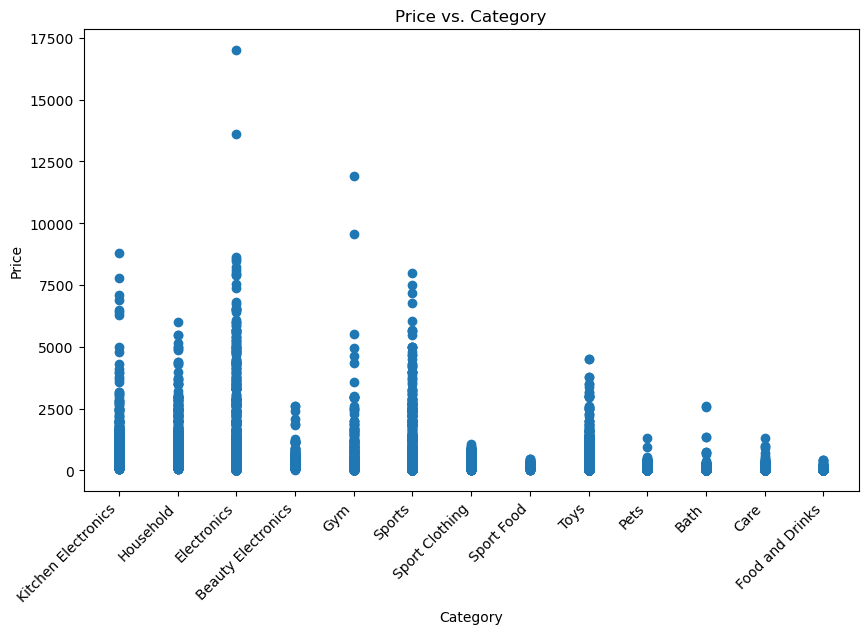

In [22]:
plt.figure(figsize=(10, 6))
category_labels = [get_display(category) for category in df_clean['category']]
plt.scatter(category_labels, df_clean['Price'])
plt.xlabel('Category')
plt.ylabel('Price')
plt.title('Price vs. Category')
plt.xticks(rotation=45, ha='right')
plt.show()

From those plots we can learn that there is no directed connection between the prices and categories...

Here we can see how many unique brands there are in each category, we will use bar plot to visualize the counts:

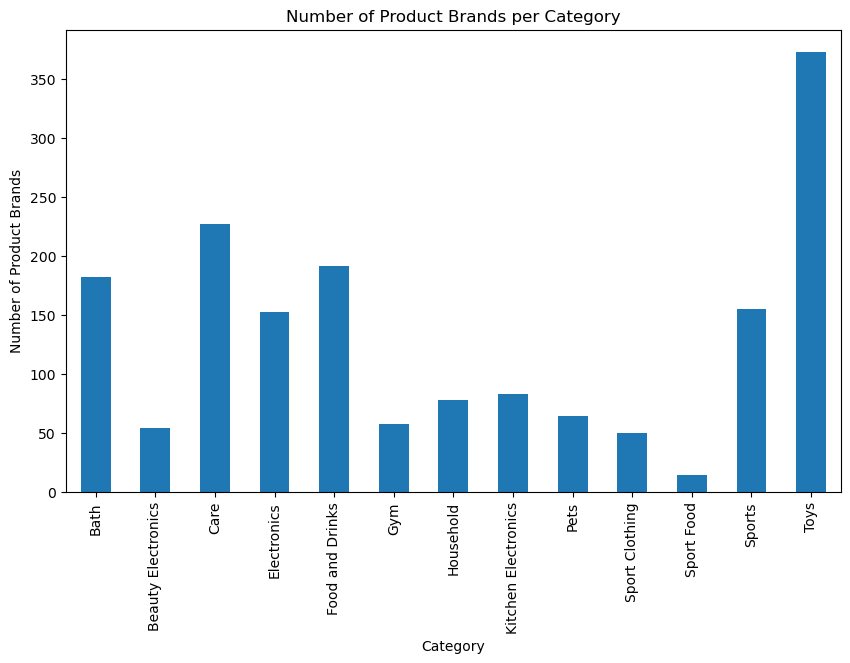

In [23]:
# Group the dataframe by 'category' and count the number of unique 'product brand' values
brand_counts = df_clean.groupby('category')['Product Brand'].nunique()

brand_counts.plot(kind='bar', figsize=(10, 6))
plt.xlabel('Category')
plt.ylabel('Number of Product Brands')
plt.title('Number of Product Brands per Category')
plt.show()

As we can see there are not too many brands in each category, that means there are products from the same brand

Let's clean the description column:

## Remove numbers, punctuation and symbles from the description:

In [24]:
df_clean=df_clean.copy()
df_clean['Description'] = df_clean['Description'].apply(lambda x: re.sub(r'[\d\W_]+', ' ', x))

## Remove single-letter words from the description

In [25]:
df_clean['Description'] = df_clean['Description'].apply(lambda x: re.sub(r'\b\w\b', '', x))

## Exploring frequent words

Now let's explore our text in the description, we will see wordclouds and bar plots of the frequent words in each category:

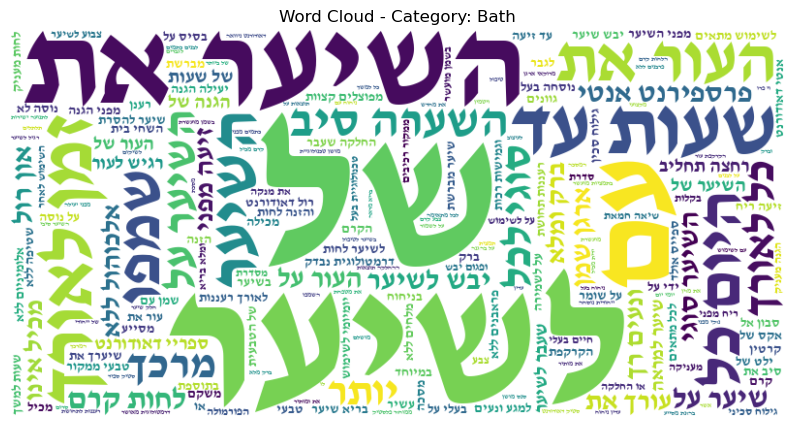

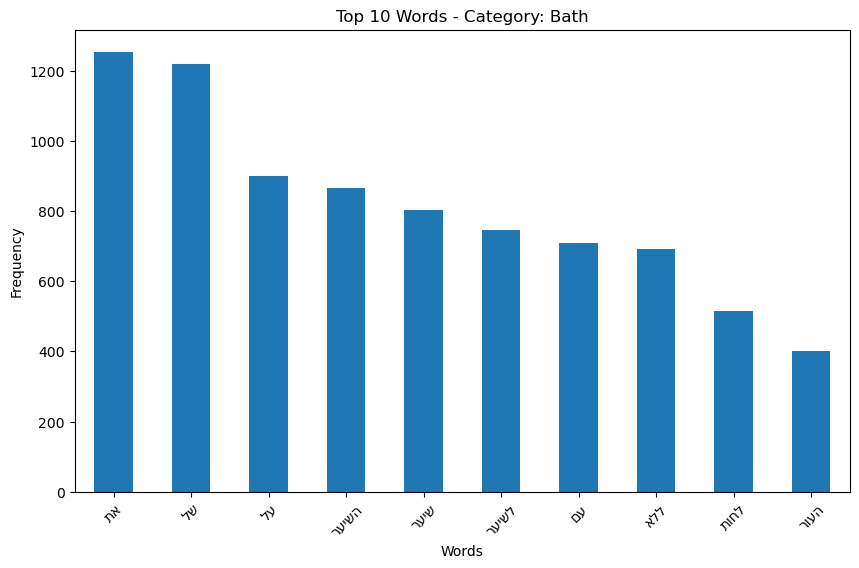

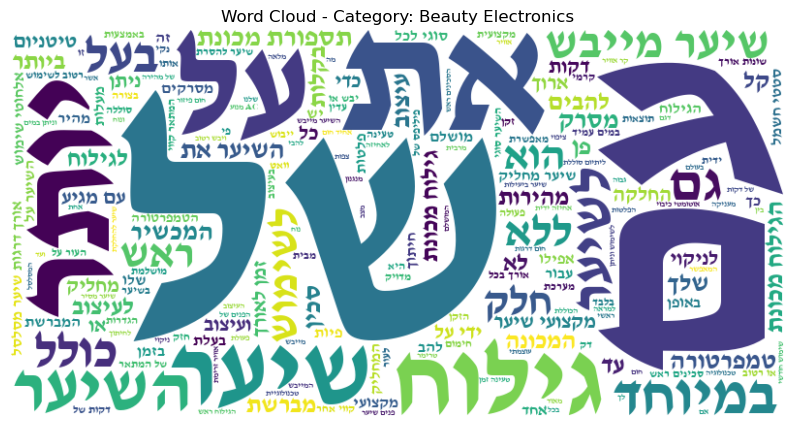

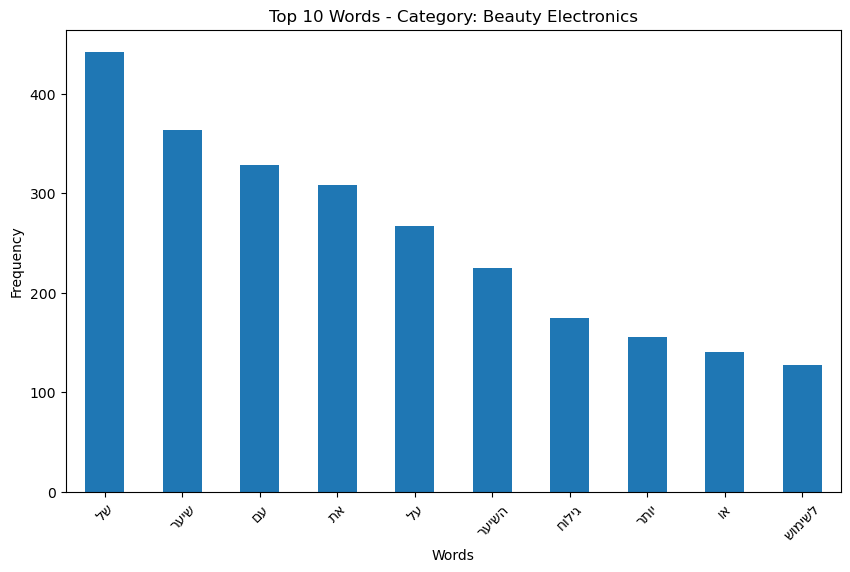

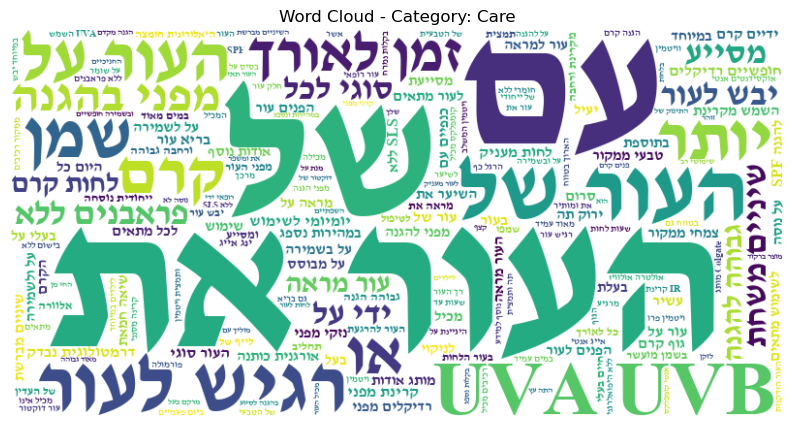

...

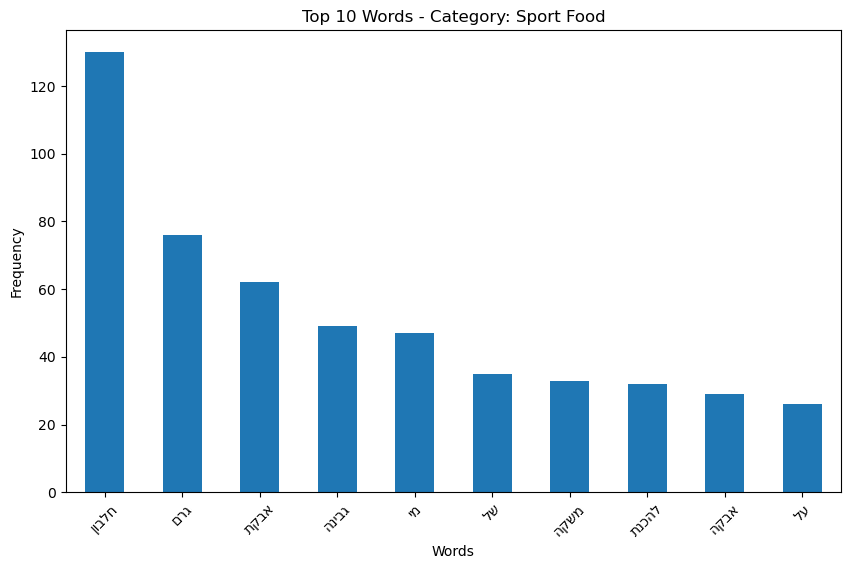

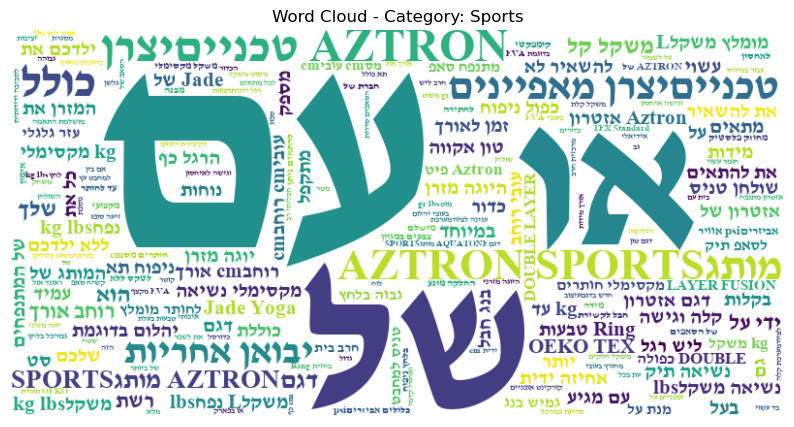

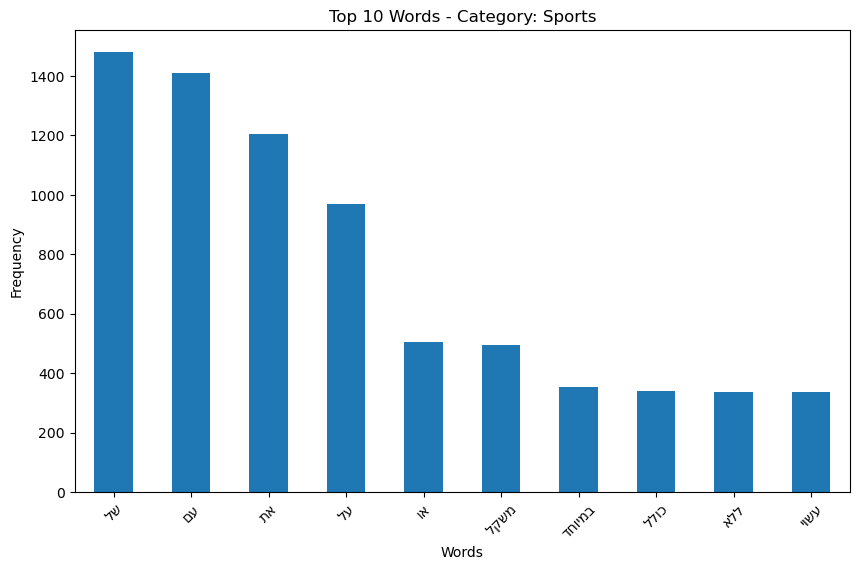

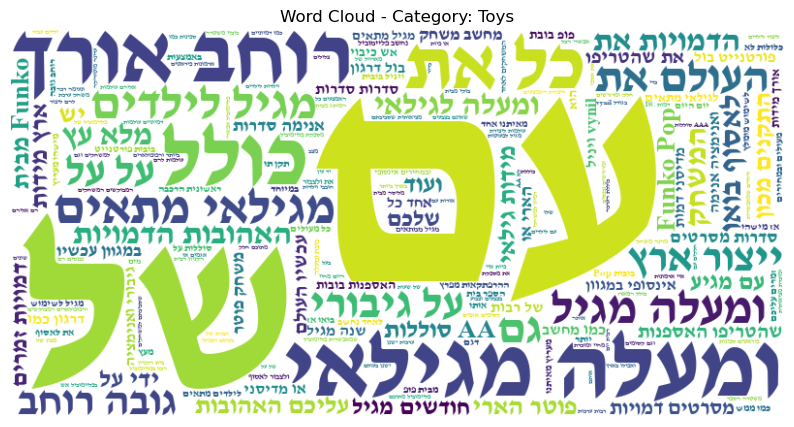

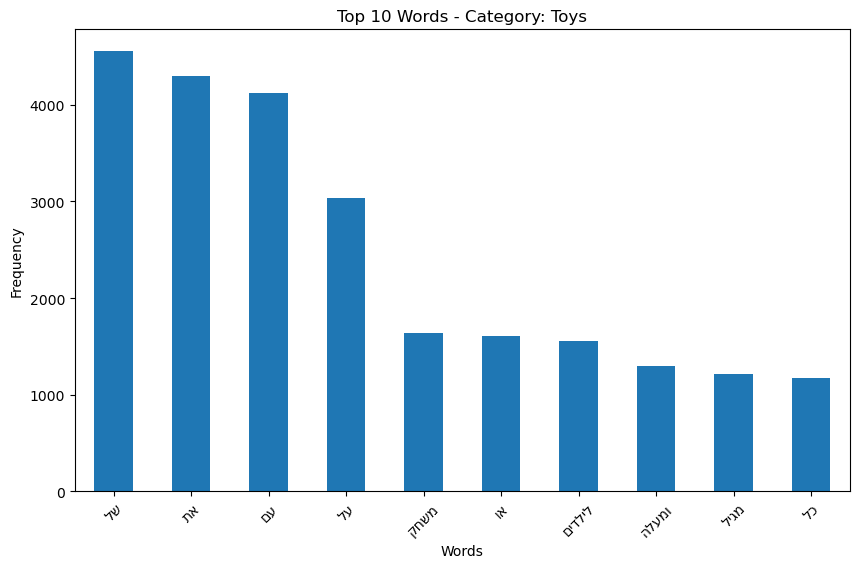

In [26]:
# Concatenate the text for each category
category_texts = df_clean.groupby('category')['Description'].apply(lambda x: ' '.join(x))

# Generate word clouds for each category
for category, text in category_texts.items():
    # Convert Hebrew text to display format
    display_text = ' '.join(get_display(word) for word in text.split())
    
    wordcloud = WordCloud(width=800, height=400, background_color='white', font_path= 'davidbd.ttf').generate(display_text)
    
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud - Category: {category}')
    plt.axis('off')
    plt.show()
    
    # Generate word frequency bar plot for each category
    # Convert Hebrew text to display format for bar plot as well
    display_words = [get_display(word) for word in text.split()]
    word_freq = pd.Series(display_words).value_counts().sort_values(ascending=False).head(10)
    word_freq.plot(kind='bar', figsize=(10, 6))
    plt.title(f'Top 10 Words - Category: {category}')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

As we can see, there are many words that apear in all the categories and are not useful to predict the category...

## Remove words that repeat in all categories in the description:

Now we will remove words that do not affect the classification of the product. we will use a counter to count how many times each word apear and if it is a word that repeats a lot we will remove it.

In [27]:
from collections import Counter

In [28]:
df1=df_clean.copy()

all_text = ' '.join(df1['Description'])

words = re.findall(r'\b\w+\b', all_text)
freq_dist = Counter(words)
threshold = 5000
repeat_words = [word for word, count in freq_dist.items() if count > threshold]

for category in df1['category'].unique():
    category_text = df1.loc[df1['category'] == category, 'Description']
    cleaned_text = category_text.str.replace(r'\b(?:{})\b'.format('|'.join(re.escape(word) for word in repeat_words)), '', regex=True)
    
    # Assign the cleaned text back to our DataFrame
    df1.loc[df1['category'] == category, 'Description'] = cleaned_text

New word clouds and bar plots for each category with the words that repeat only in the category:

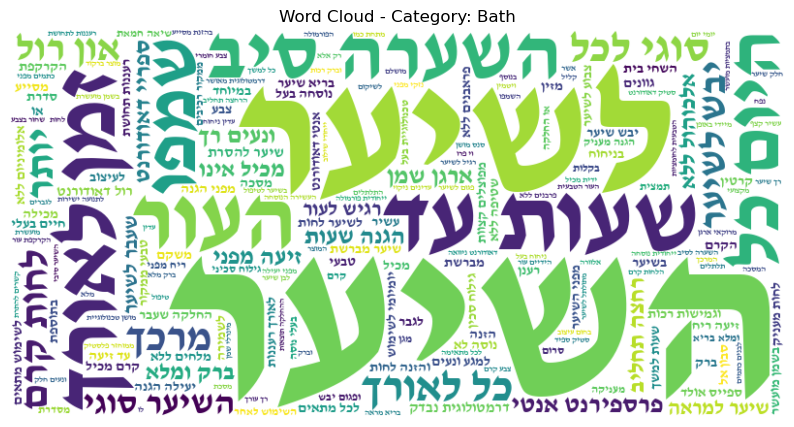

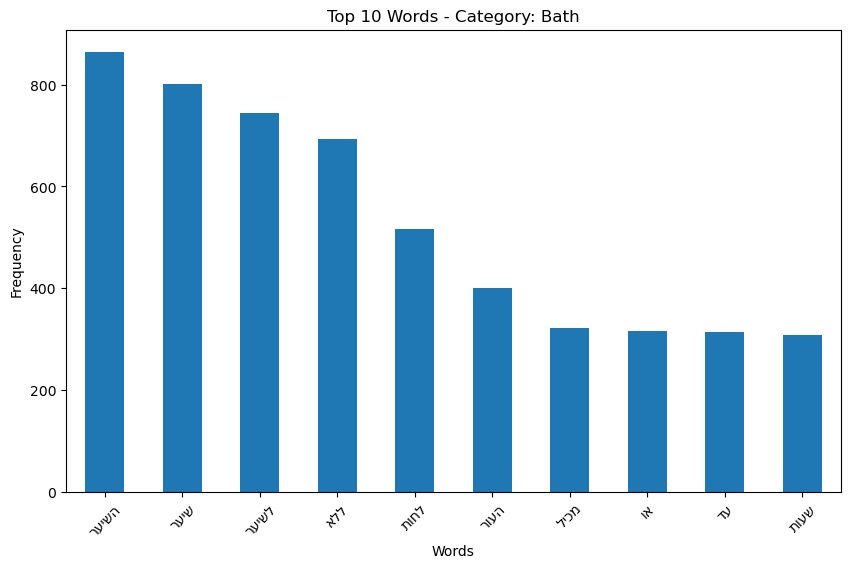

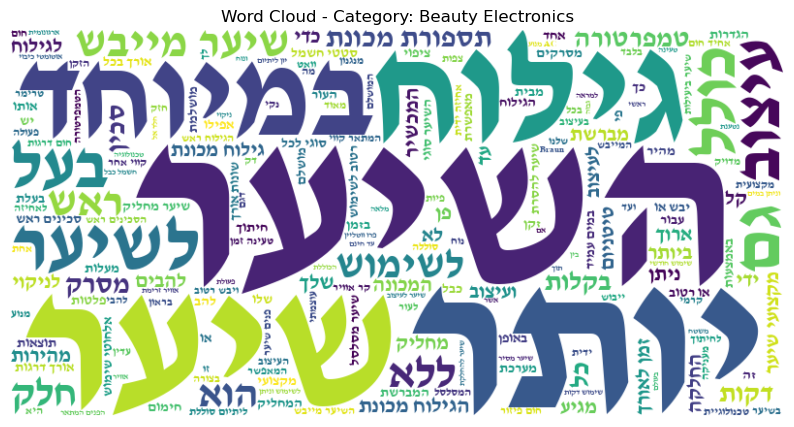

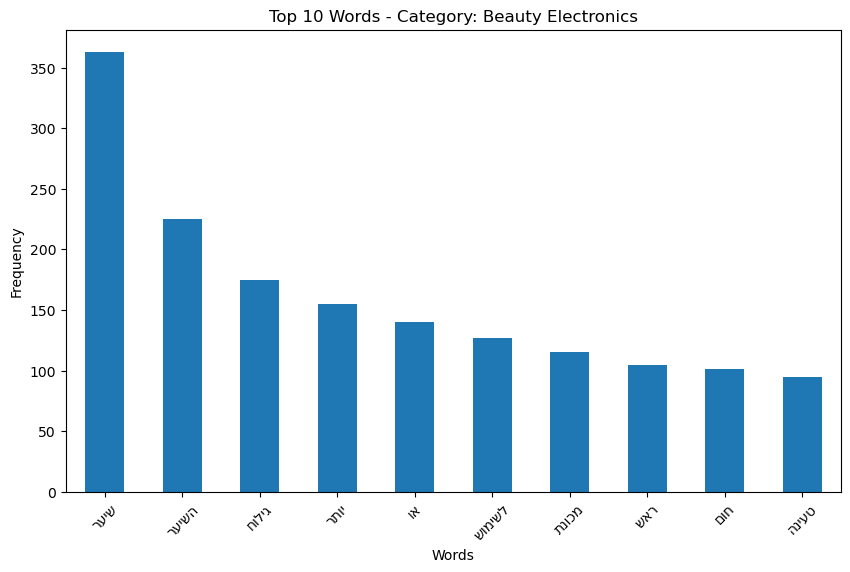

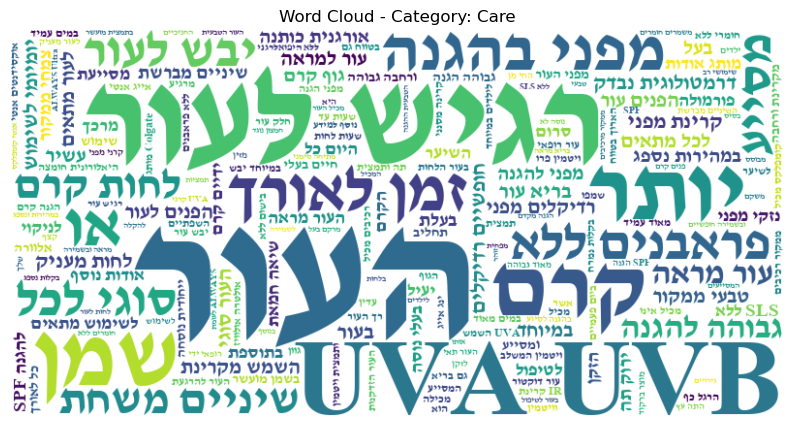

...

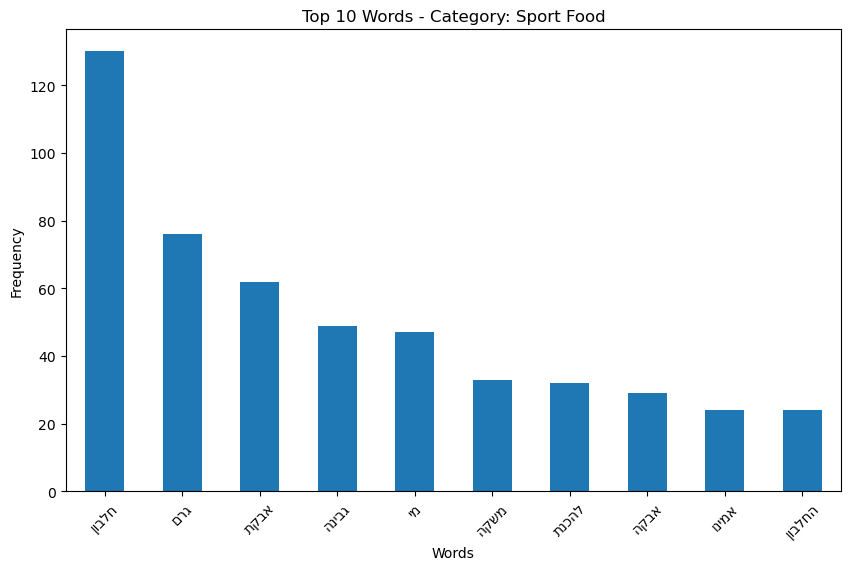

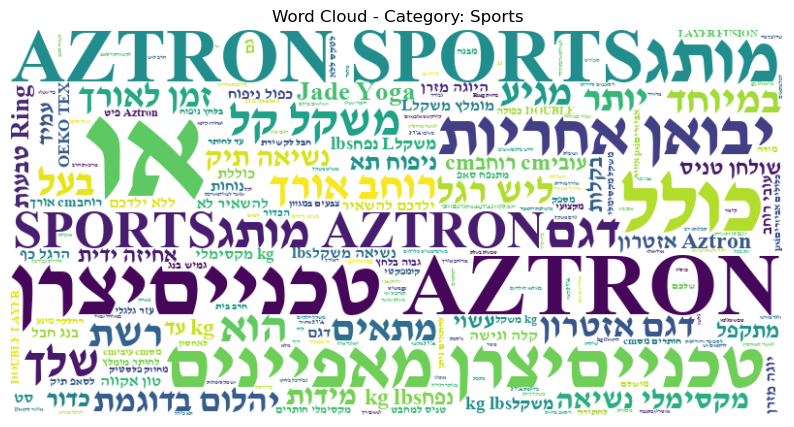

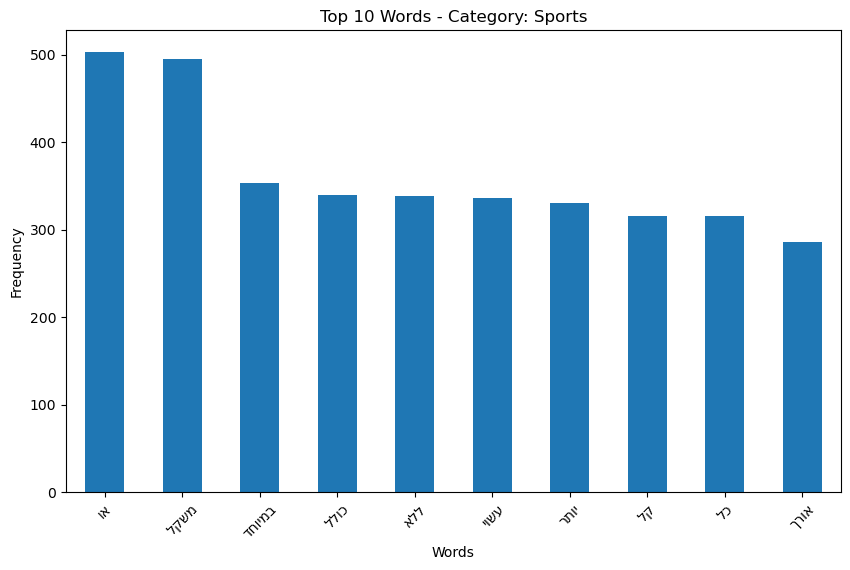

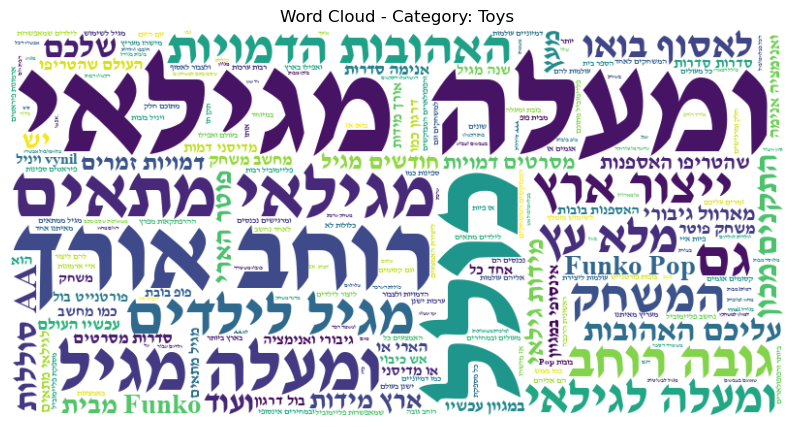

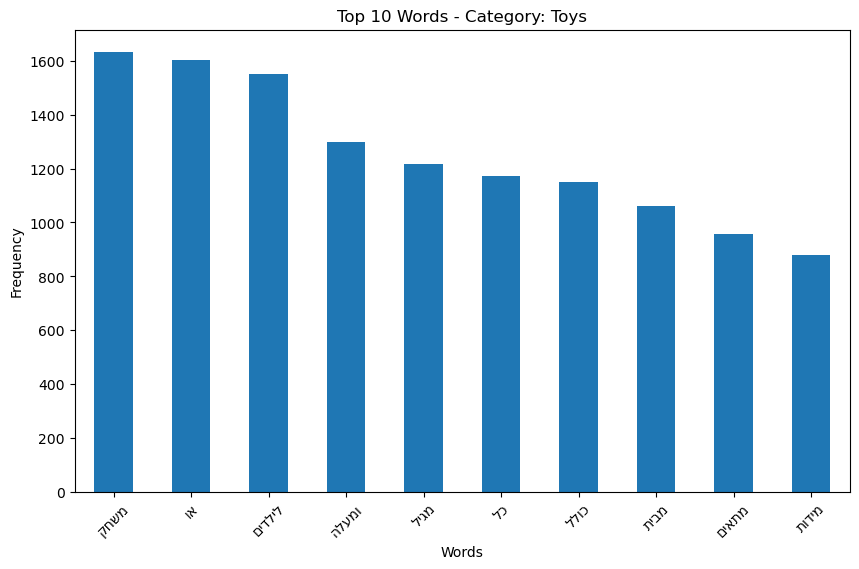

In [29]:
# Concatenate the text for each category
category_texts = df1.groupby('category')['Description'].apply(lambda x: ' '.join(x))

# Generate word clouds for each category
for category, text in category_texts.items():
    # Convert Hebrew text to display format
    display_text = ' '.join(get_display(word) for word in text.split())
    
    wordcloud = WordCloud(width=800, height=400, background_color='white', font_path= 'davidbd.ttf').generate(display_text)
    
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud - Category: {category}')
    plt.axis('off')
    plt.show()
    
    # Generate word frequency bar plot for each category
    # Convert Hebrew text to display format for bar plot as well
    display_words = [get_display(word) for word in text.split()]
    word_freq = pd.Series(display_words).value_counts().sort_values(ascending=False).head(10)
    word_freq.plot(kind='bar', figsize=(10, 6))
    plt.title(f'Top 10 Words - Category: {category}')
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.xticks(rotation=45)
    plt.show()

# WOW!

Here we can see a really cool display of the words, each wordcloud is in a shape that match the category:

We are mapping the categories to mask images we created for each category and then display the wordcloud in those masks.

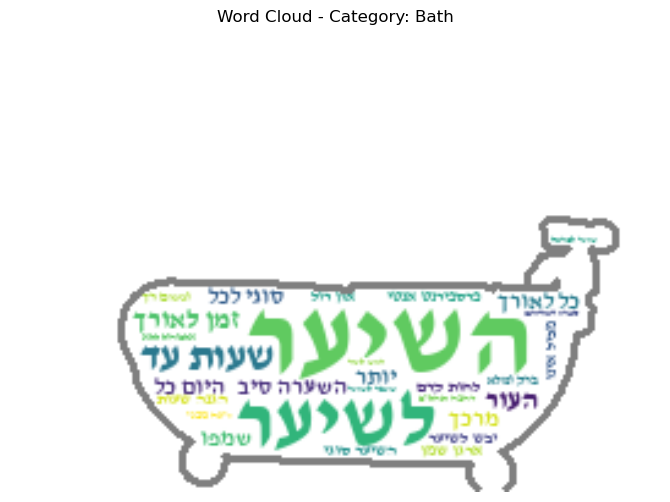

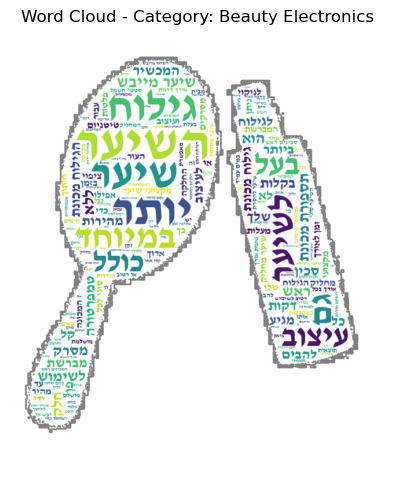

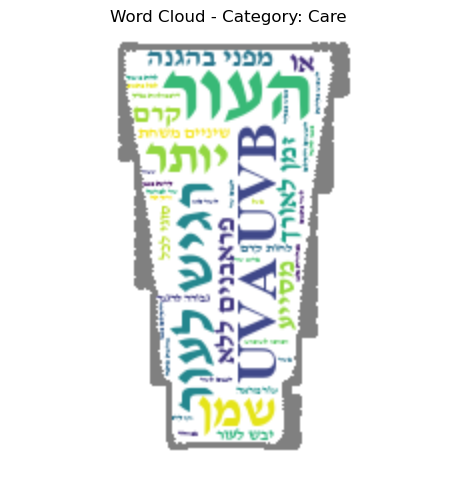

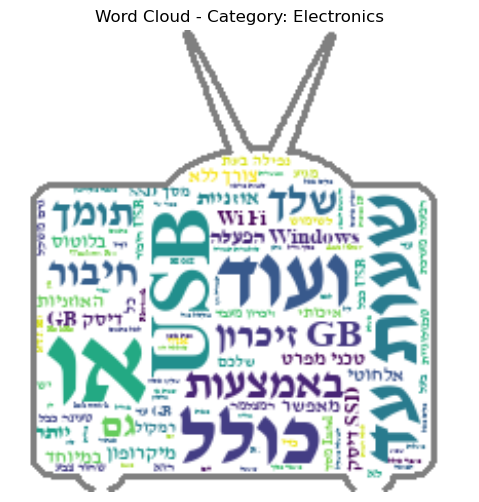

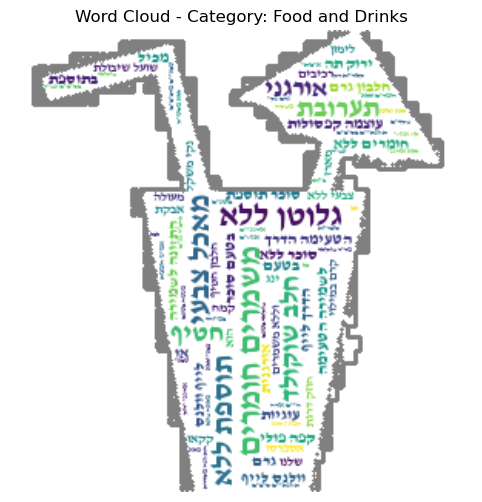

...

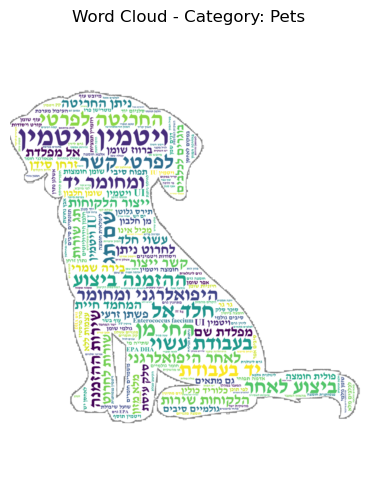

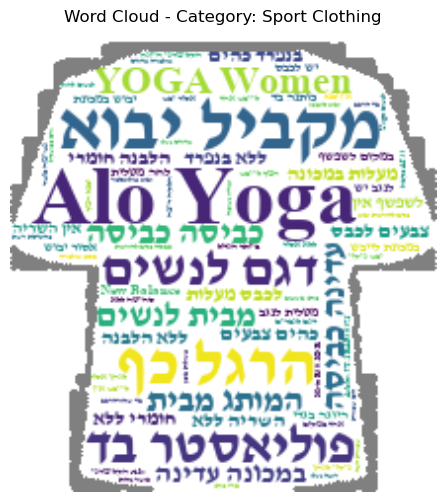

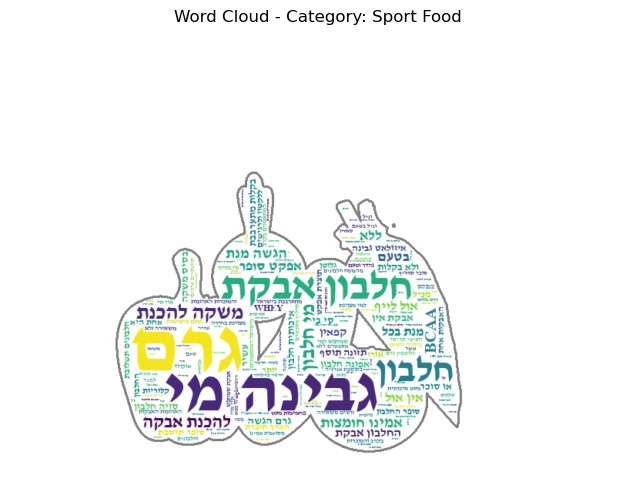

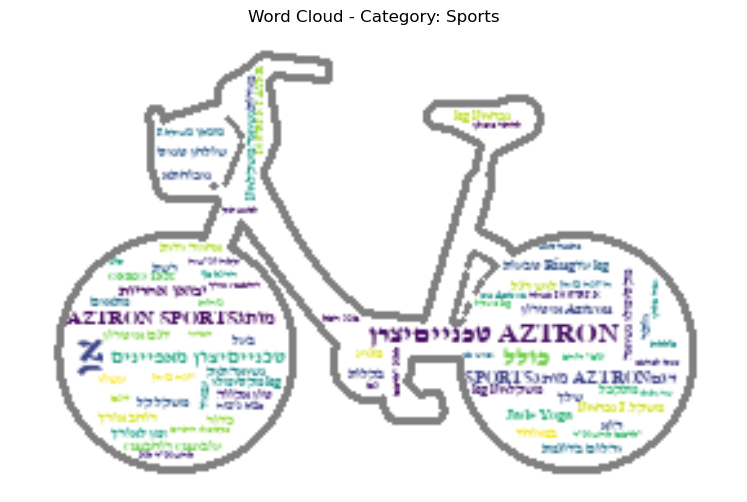

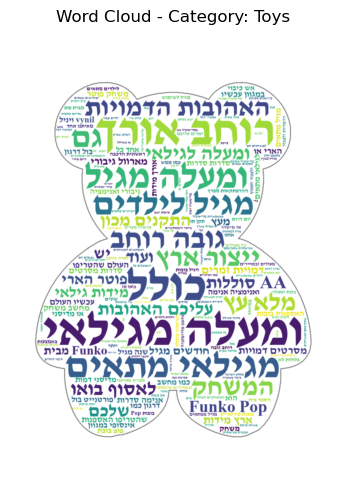

In [30]:
category_texts = df1.groupby('category')['Description'].apply(lambda x: ' '.join(x))
# Load the mask images for each category
mask_images = {
    'Kitchen Electronics': np.array(Image.open("Images/kitchen.png")),
    'Household': np.array(Image.open("Images/house.jpg")),
    'Electronics': np.array(Image.open("Images/electronics.png")),
    'Beauty Electronics': np.array(Image.open("Images/beauty.jpg")),
    'Gym': np.array(Image.open("Images/gym.jpg")),
    'Sports': np.array(Image.open("Images/sports.png")),
    'Sport Clothing': np.array(Image.open("Images/clothing.jpg")),
    'Sport Food': np.array(Image.open("Images/sportfood.png")),
    'Toys': np.array(Image.open("Images/toy.png")),
    'Pets': np.array(Image.open("Images/pet.jpg")),
    'Bath': np.array(Image.open("Images/bath.png")),
    'Care': np.array(Image.open("Images/care.jpg")),
    'Food and Drinks': np.array(Image.open("Images/food.jpg"))
}

# Generate word clouds and plots for each category
for category, text in category_texts.items():
    # Convert Hebrew text to display format
    display_text = ' '.join(get_display(word) for word in text.split())

    # Create word cloud using the mask image for the current category
    mask_image = mask_images[category]
    wordcloud = WordCloud(mask=mask_image, background_color='white', colormap='viridis',contour_width=3, contour_color='gray',
                          font_path='davidbd.ttf').generate(display_text)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud - Category: {category}')
    plt.axis('off')
    plt.show()


# Predict the category!

Import libraries:

In [31]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix

Now let's starst train our model! we will use TF-IDF. it is a numerical statistic used to determine the importance of a term in a collection of documents. TF-IDF takes into account the frequency of a term in a document (TF) and the rarity of the term across all documents (IDF).

First, split the data. we will try to predict the 'category' column based on the 'Description' column:

In [32]:
X = df1['Description'] 
y = df1['category']  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Now we will create our pipeline object and see our model:

We will use the Naive Bayes classifier first:

### Naive Bayes

In [33]:
# Define the pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', MultinomialNB())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict the categories for the training and test data
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate the train and test accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.8642988775339253
Testing Accuracy: 0.7996649916247907


we got 86.4% on the training but 79.9% on testing... let's try a different model

### Decision Tree

In [34]:
# Define the pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', DecisionTreeClassifier())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict the categories for the training and test data
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate the train and test accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.9978220807505445
Testing Accuracy: 0.8385259631490787


Here we have 99.7% on the training but 84.3% on the testing... overfitting?

Let's try to adjust the 'max_depth' and 'min_samples_split' features to get better results:

In [35]:
# Define the pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', DecisionTreeClassifier(max_depth=150, min_samples_split=200))
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict the categories for the training and test data
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate the train and test accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.8424359189143911
Testing Accuracy: 0.7675041876046901


### Random Forest

Let's try a different model to improve the score:

In [36]:
# Define the pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', RandomForestClassifier())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict the categories for the training and test data
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate the train and test accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.9978220807505445
Testing Accuracy: 0.9082077051926298


Overfitting again, let's try to adjust the 'n_estimators', 'max_depth' and 'min_samples_split'

In [37]:
# Define the pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', RandomForestClassifier(n_estimators=100, max_depth=200, min_samples_split=200))
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict the categories for the training and test data
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate the train and test accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.8987267549003183
Testing Accuracy: 0.8482412060301507


Better! let's try another model:

### Logistic Regression

In [38]:
# Define the pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', LogisticRegression())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict the categories for the training and test data
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate the train and test accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

C:\Users\shani\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Training Accuracy: 0.9705143240073714
Testing Accuracy: 0.925963149078727


We got a really good score! let's try to improve that even more by using one last model:

### SVM

In [39]:
# Define the pipeline
pipeline = Pipeline([
    ('tfidf', TfidfVectorizer()),
    ('classifier', SVC())
])

# Fit the pipeline to the training data
pipeline.fit(X_train, y_train)

# Predict the categories for the training and test data
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate the train and test accuracies
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Training Accuracy:", train_accuracy)
print("Testing Accuracy:", test_accuracy)

Training Accuracy: 0.9955603953761099
Testing Accuracy: 0.9343383584589615


Calculate precision, recall, and F1 score:

In [40]:
train_precision = precision_score(y_train, y_train_pred, average='weighted')
train_recall = recall_score(y_train, y_train_pred, average='weighted')
train_f1 = f1_score(y_train, y_train_pred, average='weighted')

test_precision = precision_score(y_test, y_test_pred, average='weighted')
test_recall = recall_score(y_test, y_test_pred, average='weighted')
test_f1 = f1_score(y_test, y_test_pred, average='weighted')

print("Training Precision:", train_precision)
print("Training Recall:", train_recall)
print("Training F1 Score:", train_f1)
print("Testing Precision:", test_precision)
print("Testing Recall:", test_recall)
print("Testing F1 Score:", test_f1)

Training Precision: 0.995565510297568
Training Recall: 0.9955603953761099
Training F1 Score: 0.9955589588844725
Testing Precision: 0.9380288677292611
Testing Recall: 0.9343383584589615
Testing F1 Score: 0.9340968849902715


Great! we have 93.4% accuracy. that's a big improvement (our first model had only 79.9%). 

Now we will look at the confusion matrix:

## Confusion Matrix

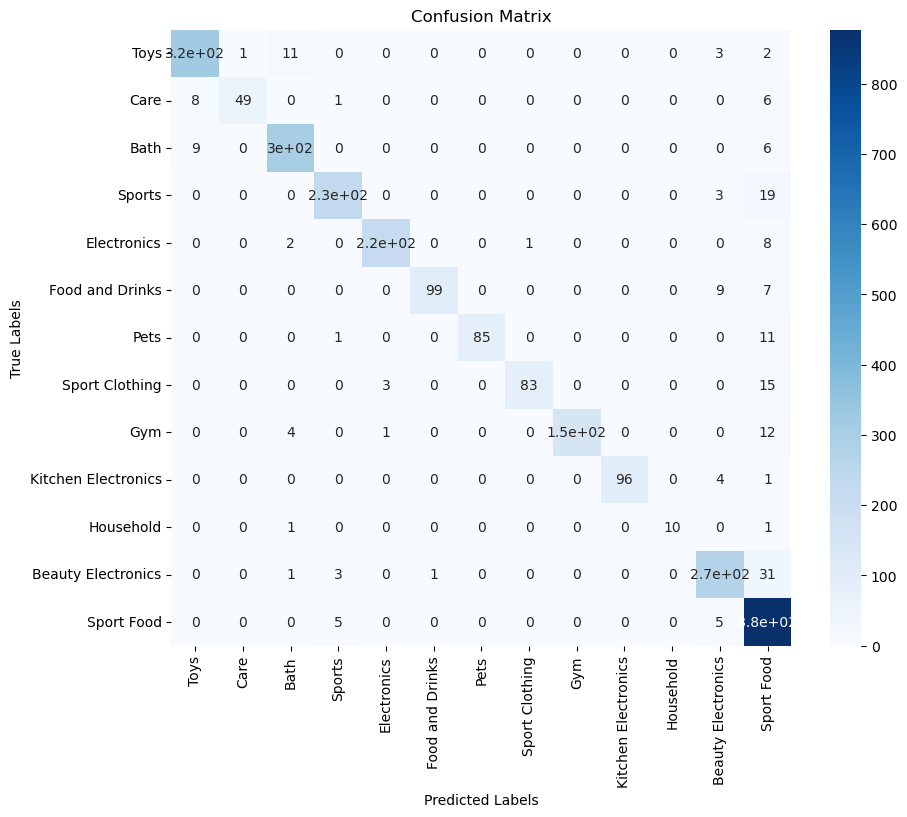

In [41]:
y_true = y_test 
y_pred = y_test_pred
cm = confusion_matrix(y_true, y_pred)
cm_df = pd.DataFrame(cm, index=categories, columns=categories)
plt.figure(figsize=(10, 8))
sns.heatmap(cm_df, annot=True, cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

As we can see, most categories were predicted correctly

Let's try predict the category for a given description (the text was taken from a different website - IVORY)

In [42]:
new_text = "מחשב נייח גיימינג IVORY הכולל מעבד i7-12700F Intel, זכרון 32GB, כונן 1TB SSD, לוח ASUS, כ.מסך RTX 3050 8GB"

# Use the pipeline to predict the category for our new text
predicted_category = pipeline.predict([new_text])[0]

print("Text:", new_text)
print("Predicted Category:", predicted_category)

Text: מחשב נייח גיימינג IVORY הכולל מעבד i7-12700F Intel, זכרון 32GB, כונן 1TB SSD, לוח ASUS, כ.מסך RTX 3050 8GB
Predicted Category: Electronics


As we can see it predicted the correct category even for a description from a different store!